# Project - Kraftwerk

## Master Thesis

Clemens Wöhrer

# Teufelmühle - hourly Prediction

---

# Install and Load Packages

In [1]:
!pip install --upgrade pip
!pip install pandas
!pip install matplotlib
!pip install seaborn
!pip install statsmodels
!pip install sklearn
!pip install plotly
!pip install pmdarima
!pip install ipylab

     |████████████████████████████████| 1.7 MB 23.7 MB/s eta 0:00:01
  Attempting uninstall: pip
    Found existing installation: pip 21.2.4
    Uninstalling pip-21.2.4:
      Successfully uninstalled pip-21.2.4
     |████████████████████████████████| 11.5 MB 23.6 MB/s            
     |████████████████████████████████| 11.3 MB 17.2 MB/s            
     |████████████████████████████████| 884 kB 29.8 MB/s            
     |████████████████████████████████| 3.1 MB 28.2 MB/s            
     |████████████████████████████████| 1.2 MB 29.2 MB/s            
     |████████████████████████████████| 292 kB 25.1 MB/s            
     |████████████████████████████████| 9.9 MB 18.1 MB/s            
     |████████████████████████████████| 233 kB 26.2 MB/s            
  Preparing metadata (setup.py) ... done
     |████████████████████████████████| 25.9 MB 25.7 MB/s            
     |████████████████████████████████| 306 kB 27.4 MB/s            
  Created wheel for sklearn: filename=sklearn-0.0-py2.

     |████████████████████████████████| 25.3 MB 25.1 MB/s            
     |████████████████████████████████| 1.5 MB 19.2 MB/s            
     |████████████████████████████████| 1.9 MB 29.4 MB/s            
     |████████████████████████████████| 822 kB 29.5 MB/s            
     |████████████████████████████████| 121 kB 26.6 MB/s            
     |████████████████████████████████| 1.6 MB 27.4 MB/s            
     |████████████████████████████████| 243 kB 27.0 MB/s            


In [2]:
%run functions.ipynb

In [3]:
np.random.seed(1234)
tf.random.set_seed(1234)

---

# Load Data

In [4]:
#Load folders
#lpd = Path("../Data/Lastprofildaten")
#wasser = Path("../Data/Wasserdaten")
#wetter = Path("../Data/Wetterdaten")
output = Path("../Data/Outputdaten")
forecast = Path("../Data/Forecast")

#Load csv names 
#mm_data = get_files(lpd, 'Lastprofil_Magerlmühle_*.csv')
#ps_data = get_files(lpd, 'Lastprofil_Pürnstein_*.csv')
#tm_data = get_files(lpd, 'Lastprofil_Teufelmühle_*.csv')
#wetter_files = get_files(wetter, '*.csv')
#wasser_files = get_files(wasser, '*.csv')

#Load dataframes from pickle
mm_all = pd.read_pickle(os.path.join(output, "mm_all.pkl"))
pm_all = pd.read_pickle(os.path.join(output, "pm_all.pkl"))
tm_all = pd.read_pickle(os.path.join(output, "tm_all.pkl"))

In [5]:
data = pd.read_pickle(os.path.join(output, "tm_all.pkl"))

In [6]:
# Selecting Data greater than date 2010-07-01
data = data[data['timestamp'] >= '2010-07-01 00:00:00']

In [7]:
data.head()

,timestamp,kw,Temperature,Growing_Degree_Days,Precipitation_Total,Snowfall_Amount,Relative_Humidity,Wind_Speed,Wind_Direction,Wind_Gust,...,Diffuse_Shortwave_Radiation,Mean_Sea_Level_Pressure,Evapotranspiration,FAO_Reference_Evapotranspiration,Temperature,Soil_Temperature,Soil_Moisture,Vapor_Pressure_Deficit,waterlevel,watertemperature
6552,2010-07-01 00:00:00,160.542,19.87972,0.411655,0.0,0.0,70.0,4.104631,52.125000,4.68,...,0.0,1018.9,0.0,0.006250,12.69,18.550018,0.234,6.797056,142.000,15.3
6553,2010-07-01 01:00:00,155.844,19.29972,0.387488,0.0,0.0,69.0,4.334974,41.633530,4.68,...,0.0,1018.8,0.0,0.007693,11.69,17.940002,0.234,6.774275,140.650,15.3
6554,2010-07-01 02:00:00,150.546,18.85972,0.369155,0.0,0.0,69.0,4.104631,52.125000,4.32,...,0.0,1018.7,0.0,0.006324,11.27,17.350006,0.234,6.590325,140.000,15.3
6555,2010-07-01 03:00:00,147.904,18.44972,0.352072,0.0,0.0,71.0,4.334974,48.366455,4.32,...,0.0,1018.5,0.0,0.006055,10.97,16.790009,0.234,6.008495,139.725,15.3
6556,2010-07-01 04:00:00,148.886,18.13972,0.339155,0.0,0.0,73.0,4.610250,51.340180,4.32,...,0.0,1018.6,0.0,0.005873,10.78,16.260010,0.234,5.486001,139.800,15.3


# Previous KW values to be used as features.

By moving KW values on certain lags, such as 1(move by 1 hour), 24(move by 1 day), 48(move by 2 days) and so on till move by a week, we have create few more features which are directly related to kw. We are interested to know that how these past value will affect present and future KW values. 


In [8]:
pp = data.set_index('timestamp')
pp["kw_24"] = pp["kw"].diff(24)
pp["kw_48"] = pp["kw"].diff(24*2)
pp["kw_72"] = pp["kw"].diff(24*3)
pp["kw_96"] = pp["kw"].diff(24*4)
pp["kw_120"] = pp["kw"].diff(24*5)
pp["kw_144"] = pp["kw"].diff(24*6)
pp["kw_168"] = pp["kw"].diff(24*7)
pp["kw_192"] = pp["kw"].diff(24*8)

---

# Data Info

In [9]:
# Checking Missing values in kw:

pp.query('kw != kw')

,kw,Temperature,Growing_Degree_Days,Precipitation_Total,Snowfall_Amount,Relative_Humidity,Wind_Speed,Wind_Direction,Wind_Gust,Cloud_Cover_Total,...,waterlevel,watertemperature,kw_24,kw_48,kw_72,kw_96,kw_120,kw_144,kw_168,kw_192
timestamp,,,,,,,,,,,,,,,,,,,,,
2011-03-27 02:00:00,NaN,6.469721,0.0,0.0,0.0,81.0,11.457958,43.726974,7.200000,100.000000,...,140.650,5.350,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-03-25 02:00:00,NaN,8.469721,0.0,0.0,0.0,72.0,12.682018,34.592270,15.840000,0.000000,...,183.350,6.050,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-03-31 02:00:00,NaN,3.609721,0.0,1.1,0.0,89.0,38.047756,32.637497,43.199997,100.000000,...,138.200,3.650,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-03-30 02:00:00,NaN,6.939721,0.0,0.0,0.0,72.0,14.799459,85.815090,13.679999,0.000000,...,122.550,7.950,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-03-25 02:00:00,NaN,-0.280279,0.0,0.0,0.0,82.0,19.110542,86.760300,30.960001,4.800000,...,136.400,3.550,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-03-31 02:00:00,NaN,7.979721,0.0,0.0,0.0,65.0,7.208994,2.862411,13.679999,9.900001,...,159.900,6.575,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-29 02:00:00,NaN,6.109721,0.0,0.0,0.0,76.0,18.681883,25.083572,20.880001,10.000000,...,142.175,6.875,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-03-28 02:00:00,NaN,1.829721,0.0,0.0,0.0,78.0,9.220499,308.659820,20.160000,100.000000,...,136.700,4.850,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
# Replace Null-Values with forward fill and then backward fill

pp=pp.fillna(method="pad")
pp=pp.fillna(method="bfill")
# Methode:
#  pad = forwardfill method


In [11]:
pp.head(20)

,kw,Temperature,Growing_Degree_Days,Precipitation_Total,Snowfall_Amount,Relative_Humidity,Wind_Speed,Wind_Direction,Wind_Gust,Cloud_Cover_Total,...,waterlevel,watertemperature,kw_24,kw_48,kw_72,kw_96,kw_120,kw_144,kw_168,kw_192
timestamp,,,,,,,,,,,,,,,,,,,,,
2010-07-01 00:00:00,160.542,19.879720,0.411655,0.0,0.0,70.0,4.104631,52.125000,4.68,8.1,...,142.000,15.300,-31.684,-42.392,-48.718,21.762,21.236,-1.518,-36.866,-48.514
2010-07-01 01:00:00,155.844,19.299720,0.387488,0.0,0.0,69.0,4.334974,41.633530,4.68,8.0,...,140.650,15.300,-31.684,-42.392,-48.718,21.762,21.236,-1.518,-36.866,-48.514
2010-07-01 02:00:00,150.546,18.859720,0.369155,0.0,0.0,69.0,4.104631,52.125000,4.32,0.0,...,140.000,15.300,-31.684,-42.392,-48.718,21.762,21.236,-1.518,-36.866,-48.514
2010-07-01 03:00:00,147.904,18.449720,0.352072,0.0,0.0,71.0,4.334974,48.366455,4.32,0.0,...,139.725,15.300,-31.684,-42.392,-48.718,21.762,21.236,-1.518,-36.866,-48.514
2010-07-01 04:00:00,148.886,18.139720,0.339155,0.0,0.0,73.0,4.610250,51.340180,4.32,0.9,...,139.800,15.300,-31.684,-42.392,-48.718,21.762,21.236,-1.518,-36.866,-48.514
2010-07-01 05:00:00,148.740,17.749722,0.322905,0.0,0.0,74.0,4.510787,61.389540,3.96,3.9,...,138.175,15.400,-31.684,-42.392,-48.718,21.762,21.236,-1.518,-36.866,-48.514
2010-07-01 06:00:00,124.742,17.999722,0.333322,0.0,0.0,76.0,4.610250,38.659805,3.60,2.1,...,138.625,15.400,-31.684,-42.392,-48.718,21.762,21.236,-1.518,-36.866,-48.514
2010-07-01 07:00:00,129.272,19.579721,0.399155,0.0,0.0,77.0,3.563818,44.999985,2.16,4.2,...,138.275,15.400,-31.684,-42.392,-48.718,21.762,21.236,-1.518,-36.866,-48.514
2010-07-01 08:00:00,136.224,22.129720,0.505405,0.0,0.0,69.0,3.758510,73.300750,4.32,0.0,...,138.575,15.400,-31.684,-42.392,-48.718,21.762,21.236,-1.518,-36.866,-48.514


In [12]:
pp.describe()

,kw,Temperature,Growing_Degree_Days,Precipitation_Total,Snowfall_Amount,Relative_Humidity,Wind_Speed,Wind_Direction,Wind_Gust,Cloud_Cover_Total,...,waterlevel,watertemperature,kw_24,kw_48,kw_72,kw_96,kw_120,kw_144,kw_168,kw_192
count,69408.000000,69408.000000,69408.000000,69408.000000,69408.000000,69408.000000,69408.000000,69408.000000,69408.000000,69408.000000,...,69408.000000,69408.000000,69408.000000,69408.000000,69408.000000,69408.000000,69408.000000,69408.000000,69408.000000,69408.000000
mean,99.136218,10.460955,0.152648,0.053920,0.004053,73.413511,14.186479,181.960575,19.132743,47.599735,...,135.587794,8.968248,-0.003160,-0.002160,-0.030527,0.053826,0.061365,0.011670,-0.067724,-0.094233
std,48.924456,8.162304,0.201705,0.315784,0.058785,15.708543,10.181631,105.752958,13.896539,45.134712,...,18.835656,5.921169,24.723862,30.249718,33.119946,34.646088,35.775587,37.182365,38.482440,39.485643
min,0.000000,-13.710279,0.000000,0.000000,0.000000,15.000000,0.000000,0.262802,0.000000,0.000000,...,106.125000,-0.300000,-190.246000,-185.692000,-187.690000,-188.960000,-183.982000,-183.596000,-185.018000,-186.826000
25%,60.858000,3.859721,0.000000,0.000000,0.000000,62.000000,6.792466,78.366360,9.000000,1.000000,...,123.225000,3.525000,-7.984000,-11.338000,-13.703000,-15.362000,-16.466500,-17.602000,-18.808500,-19.596000
50%,93.041000,10.529721,0.022072,0.000000,0.000000,75.000000,11.753877,196.389540,15.840000,30.000002,...,130.700000,8.850000,-1.872000,-2.584000,-3.028000,-3.172000,-3.188000,-3.016000,-3.226000,-3.544000
75%,142.948500,16.709720,0.279572,0.000000,0.000000,87.000000,19.191748,275.710600,25.560000,100.000000,...,142.500000,14.000000,4.570000,7.376000,9.990500,11.984000,13.492500,14.354500,14.866500,15.548000
max,195.962000,33.419720,0.833333,26.900000,3.570000,100.000000,82.785910,360.000000,102.240000,100.000000,...,326.750000,24.175000,185.198000,186.120000,191.652000,189.474000,186.094000,189.904000,185.826000,185.826000


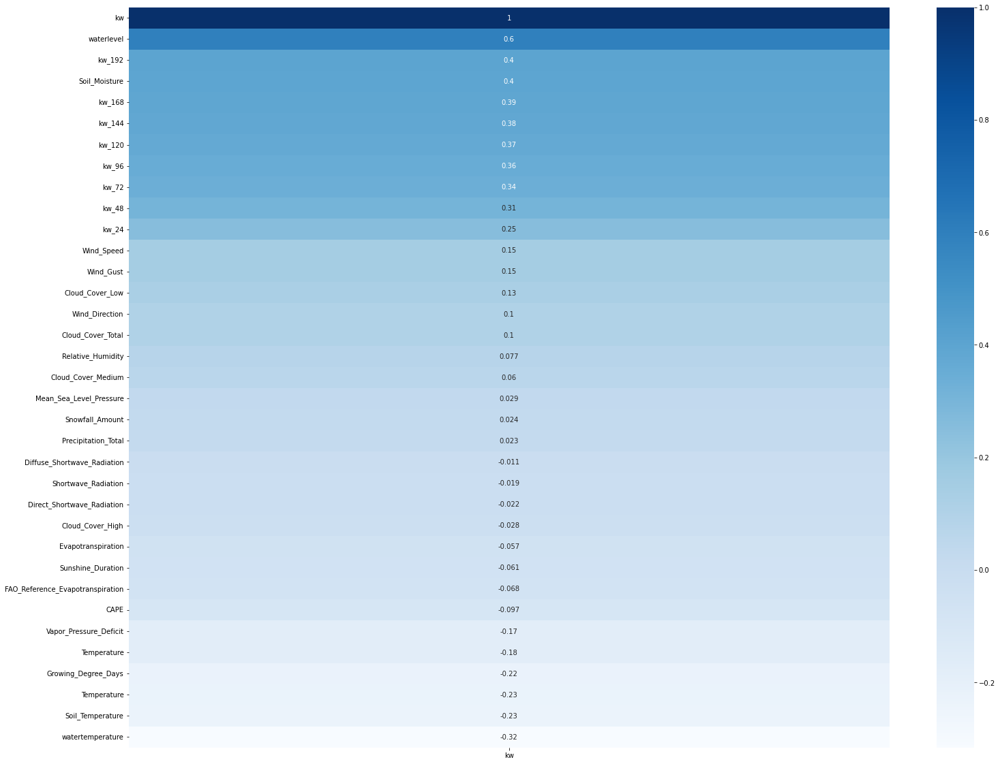

In [13]:
cor_matrix = pp.corr()
cor_matrix[['kw']]

f, ax = plt.subplots(figsize=(25, 20))
sns.heatmap(cor_matrix[['kw']].sort_values(by=['kw'], ascending =False), annot=True, cmap="Blues")
plt.show()

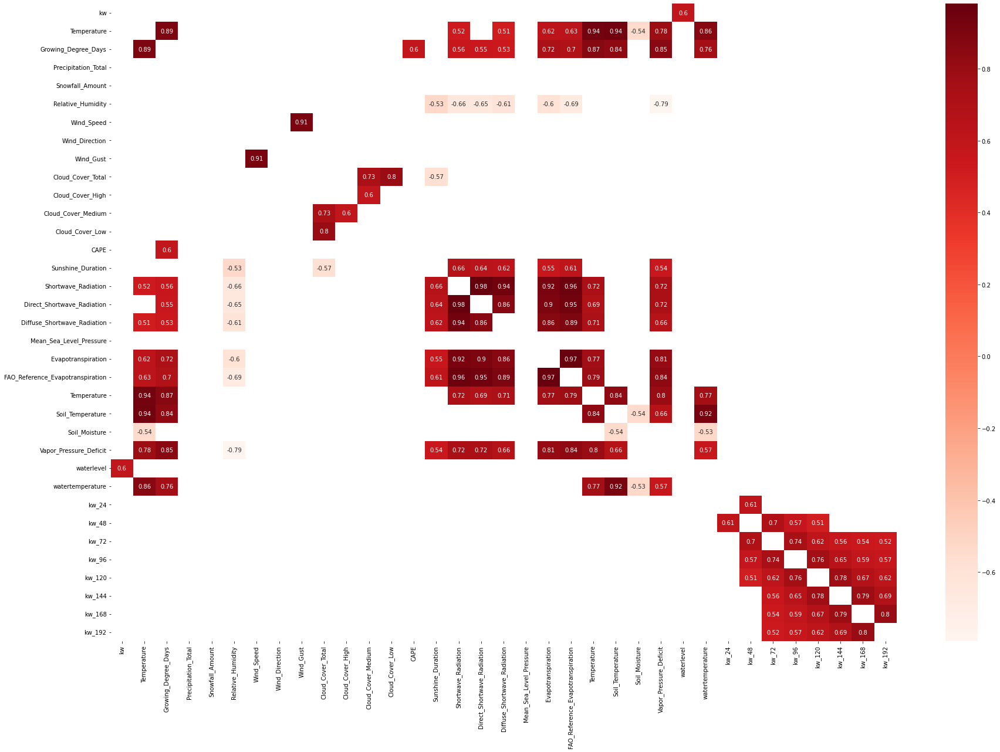

In [14]:
# Plot on correlation which is above 0.5 in both negative and positive

filteredDf = cor_matrix[((cor_matrix >= .5) | (cor_matrix <= -.5)) & (cor_matrix !=1.000)]
plt.figure(figsize=(30,20))
sns.heatmap(filteredDf, annot=True, cmap="Reds")
#plt.savefig('matrix.jpeg')
plt.show()

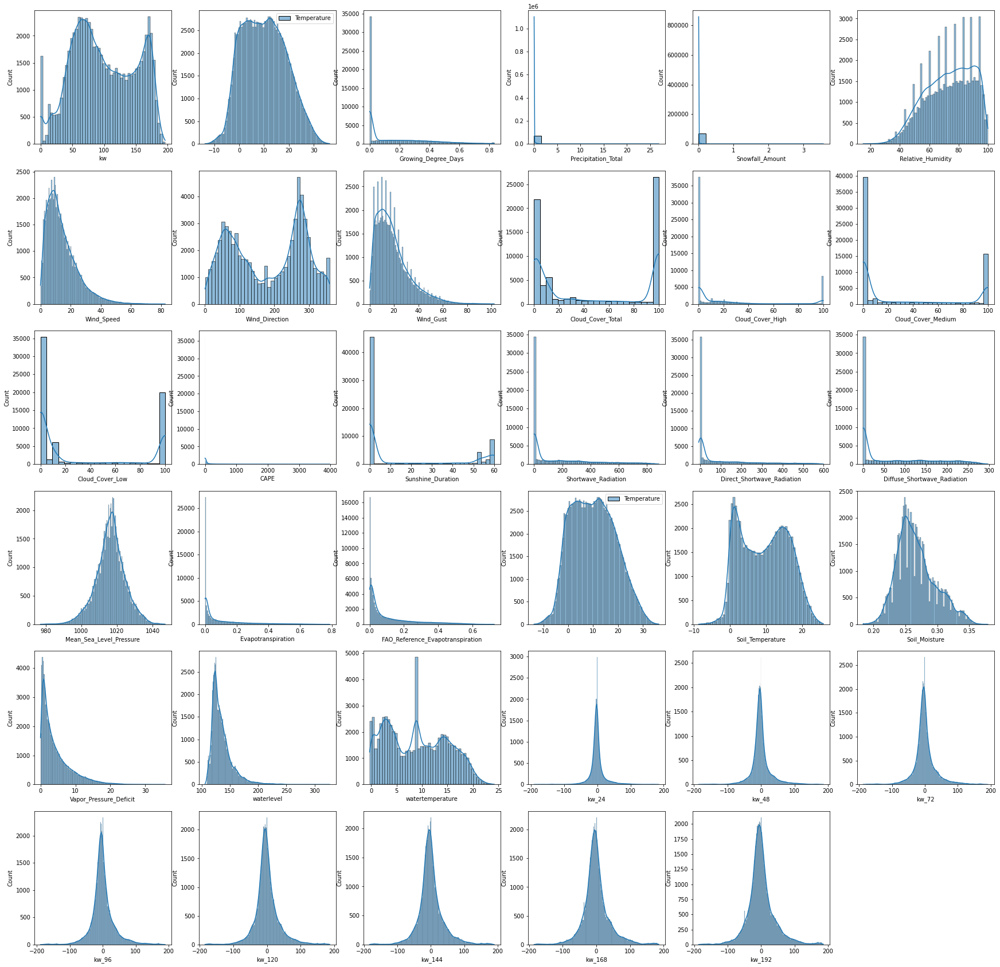

In [15]:
f, ax = plt.subplots(figsize=(30, 30))
for i, column in enumerate(pp.columns, 1):
    plt.subplot(6,6,i)
    sns.histplot(pp[column], legend=True, kde=True)

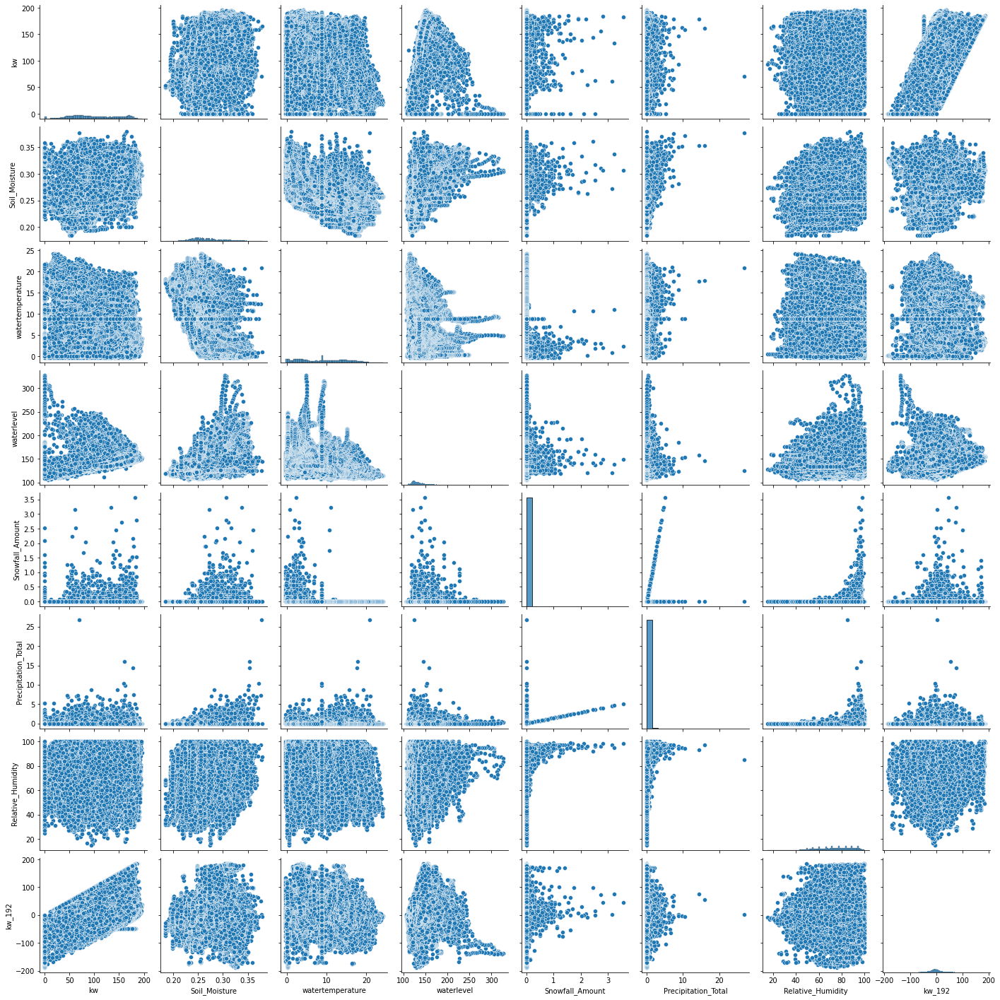

In [16]:
sns.pairplot(pp[['kw', "Soil_Moisture", "watertemperature","waterlevel",
                 "Snowfall_Amount", "Precipitation_Total", "Relative_Humidity", "kw_192"]])
plt.show()

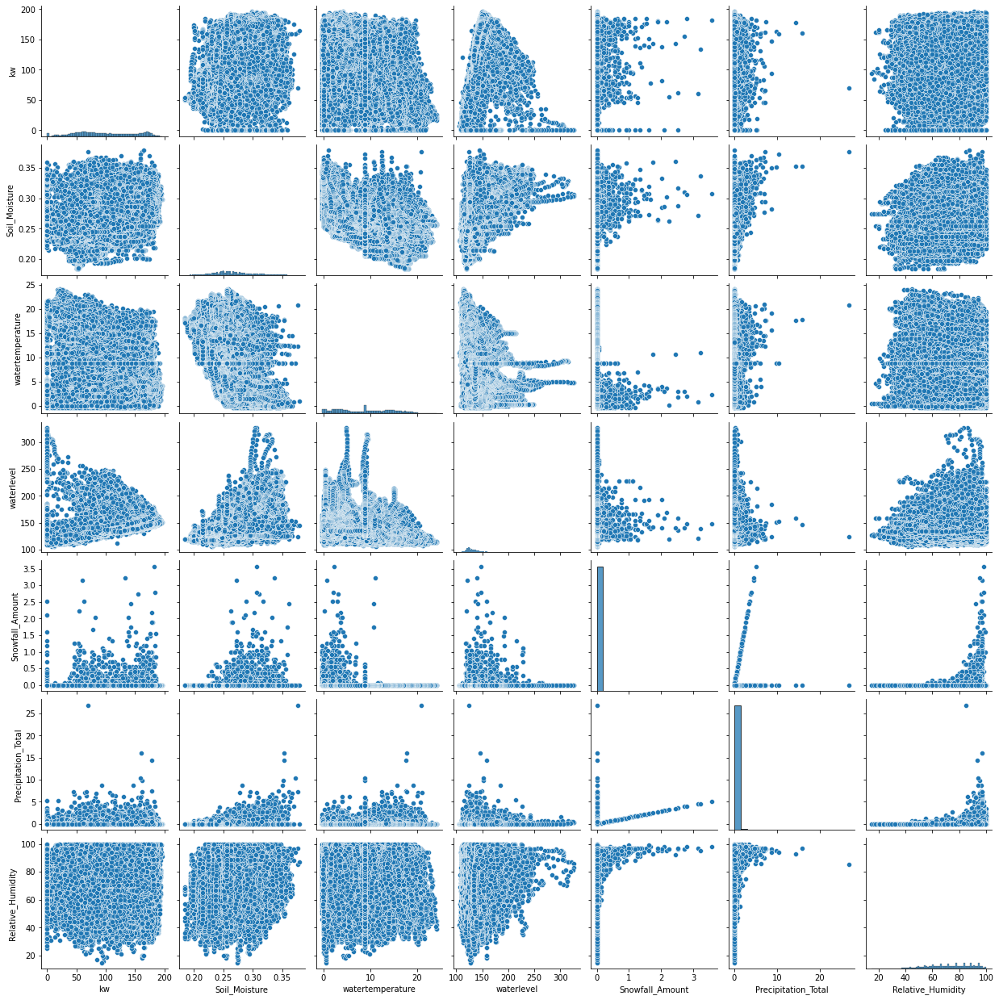

In [17]:
# Scatter plot for joint correlation

sns.pairplot(pp[['kw', "Soil_Moisture", "watertemperature","waterlevel",
                 "Snowfall_Amount", "Precipitation_Total", "Relative_Humidity"]])
plt.show()

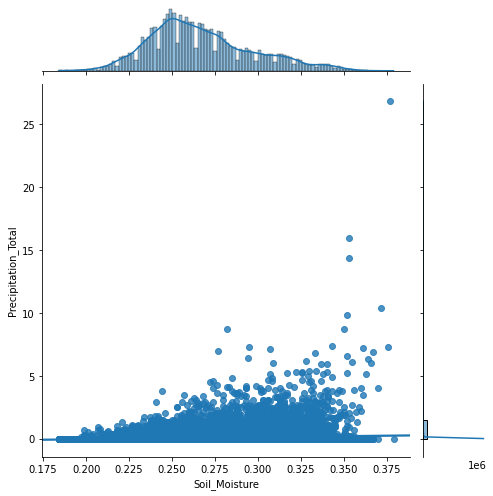

In [18]:
sns.jointplot(x="Soil_Moisture", y="Precipitation_Total", data=pp, kind="reg", truncate=False, height=7)

The heatmap shows that past lag values of kw certain affect present kw values.

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


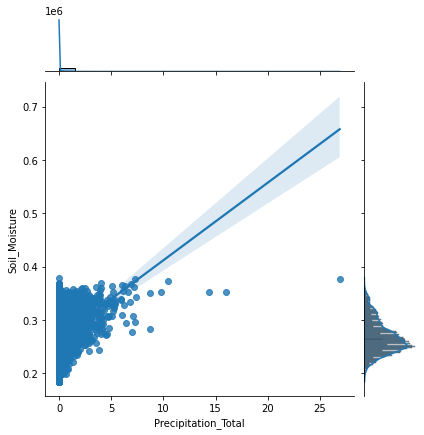

In [19]:
# pairplot of "Precipitation_Total" and "Soil_Moisture"
sns.jointplot("Precipitation_Total", "Soil_Moisture", data=pp, kind='reg');

In [20]:
# See for linear, quadratic or cubic relationship between 
fit1 = np.polyfit(pp["Soil_Moisture"], pp["Precipitation_Total"], 1)  # linear
fit2 = np.polyfit(pp["Soil_Moisture"], pp["Precipitation_Total"], 2)  # quadratic
fit3 = np.polyfit(pp["Soil_Moisture"], pp["Precipitation_Total"], 3)  # cubic

v1 = np.polyval(fit1, pp["Soil_Moisture"])
v2 = np.polyval(fit2, pp["Soil_Moisture"])
v3 = np.polyval(fit3, pp["Soil_Moisture"])

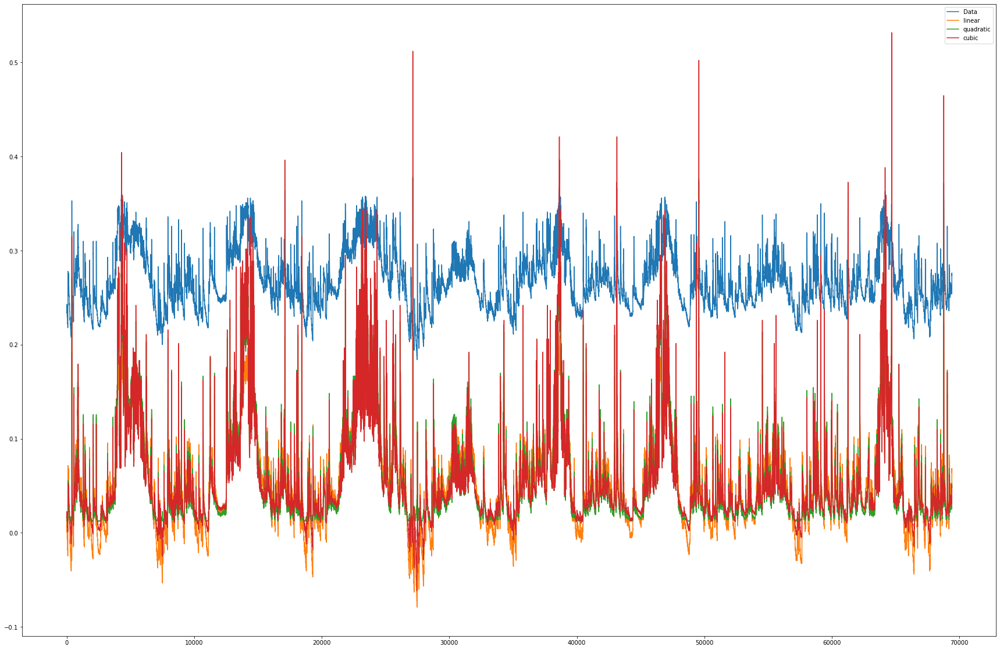

In [21]:
# looks like these both variables do seems to have strong correlation with each other as fit is quite close to
# original values

plt.figure(figsize=(30,20))
plt.plot(pp["Soil_Moisture"].values, label="Data")
plt.plot(v1, label = "linear")
plt.plot(v2, label = "quadratic")
plt.plot(v3, label = "cubic")
plt.legend()
plt.show()

In [22]:
# Split_sequence Function: 

def split_sequences(sequences, n_steps_in, n_steps_out):
    X, y = list(), list()
    for i in range(len(sequences)):
    # find the end of this pattern
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out-1
        # check if we are beyond the dataset
        if out_end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

In [23]:
# LSTM model Function

def build_lstm_model(n_neurons, lr, n_steps_in, n_features, n_steps_out):
    opt = keras.optimizers.Adam(learning_rate=lr)
    
    model = Sequential()
    
    model.add(LSTM(n_neurons, return_sequences=True, activation='tanh',
                   input_shape=(n_steps_in, n_features)))
    model.add(Dropout(0.3))
    
    model.add(LSTM(units=n_neurons, activation='tanh'))
    model.add(Dropout(0.3))
    
    model.add(Dense(n_steps_out, activation='linear'))
    model.compile(optimizer=opt, loss='mse', metrics=[tf.keras.metrics.RootMeanSquaredError()])
    model.summary()
    
    return model



%history -g -f history.py

In [24]:
import plotly.express as px
sns.set(rc={'figure.figsize':(20,10)})
fig = px.line(pp, x=pp.index, y='kw', title='Production')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label='1y', step='year', stepmode='backward'),
            dict(count=2, label='3y', step='year', stepmode='backward'),
            dict(count=3, label='5y', step='year', stepmode='backward'),
            dict(step='all')
            ])
    )
)
fig.show()

# here you can see the gap in the data from 2014 to 2018. 
# This gap should simply be ignored, i.e. the data should be viewed as if this gap did not exist. 
# So the back part should just connect to the front part. 

In [25]:
def data_split(data, test_size):
    split = len(data)-test_size
    train = data[:split]
    test = data[split:]
    
    return (train, test)

In [26]:
# Data Preparation:
# X needs to be 25 stamps ahead, and kw needs to be same

# new dataset without Test values
data, Test = data_split(pp, 720+72)

# Now shift values by * hours, however as only need x features shifted, we will drop kw from this data and then add
# it again from original data with first time stamp
df = data.shift(-25)
df = df.fillna(method="pad")
df["kw"] = data["kw"]
df["kw_192"] = data["kw_192"]

test_df = Test.shift(-25)
test_df=test_df.fillna(method="pad")
test_df["kw"] = Test["kw"]
test_df["kw_192"] = Test["kw_192"]

In [27]:
# Data Normalization: Has to be done for better predictions. All columns values range will be between 0 and 1.

def prepare_time_series(X, y, input_steps=7, output_steps=7, past=7, PCA=False):
    
    scaler1 = MinMaxScaler(feature_range=(0, 1))
    x_scaled = scaler1.fit_transform(X)
    y_scaled = scaler1.fit_transform(y.reshape((-1, 1)))
    
    if PCA == True:
        # create few features
        pca = decomposition.PCA(n_components=5)
        X_std = pca.fit_transform(x_scaled)
        dataset_stacked = hstack((X_std, y_scaled))
        print ("dataset_stacked.shape" , dataset_stacked.shape)
        
    else:
        dataset_stacked = hstack((x_scaled, y_scaled))
        
    # choose a number of time steps # change this accordingly
    n_steps_in, n_steps_out = input_steps*past, output_steps 

        # covert into input/output
    x, Y = split_sequences(dataset_stacked, n_steps_in, n_steps_out)

    print ("X.shape" , x.shape) 
    print ("y.shape" , Y.shape) 
    
    return(x, Y)

In [28]:
def train_test_split(X, y, split_size=0.9):
    
    split_point = int(len(X)*split_size)
    train_X , train_y = X[:split_point, :] , y[:split_point, :]
    test_X , test_y = X[split_point:, :] , y[split_point:, :]

    n_features = train_X.shape[2]
    
    print ("train_X.shape" , train_X.shape) 
    print ("train_y.shape" , train_y.shape)  
    print ("test_X.shape" , test_X.shape) 
    print ("test_y.shape" , test_y.shape) 
    print ("n_features" , n_features)
    
    return(train_X, train_y, test_X, test_y)

### LSTM Model for daily data

As now dataset has become much smaller, we can try large number of parameters on this model.

## Grid Sarch Method to find Optimal parameters

The below code will apply random cross validation method to find optimal parameters:
1. n-neurons: Right now we are using 50 neurons, but it can increased or decreased 
to check if it affects model results.

2. lr = Learning rate: The learning rate is an important parameter, it seems that smaller values decrease
model overfitting

3. batch_size: One batch contains 720 time steps, so it size should be a small number. Between 10-20 at maximum

4. epoch size: I have go with 100 epoch size, but we can add other number of epochs to look for better model

All these parameters are combined in dict to fed to RandomizedSearchCV method.

In the last steps the models we build with random search cv, are fitted to the data.

### Fit Different parameters and find best model.

In [29]:
# define the grid search parameters
learning_rate = [0.01, 0.001]
neurons = [50]
batch_size = [72]
epoch = [100]
params = dict(batch_size=batch_size, n_neurons=neurons, lr=learning_rate,
                     epochs=epoch)

def cross_validation(train_x, train_y, valid_x, valid_y, params_distrib= params):
    n_steps_in, n_features, n_steps_out = train_x.shape[1], train_x.shape[2], valid_y.shape[1]
    keras_reg = KerasRegressor(build_lstm_model, n_steps_in = n_steps_in, n_features=n_features,
                                       n_steps_out=n_steps_out)

    rnd_search_cv = RandomizedSearchCV(keras_reg, params_distrib, cv=3,n_iter=2,
                                       scoring="r2")
    grid_result = rnd_search_cv.fit(train_x, train_y, epochs=50, 
                    validation_data=(valid_x, valid_y))
    
    # summarize results
    print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
    means = grid_result.cv_results_['mean_test_score']
    stds = grid_result.cv_results_['std_test_score']
    params = grid_result.cv_results_['params']
    for mean, stdev, param in zip(means, stds, params):
        print("Mean: %f (Standard Deviation: %f) with: %r" % (mean, stdev, param))
    
    # Accuracy and loss
    fig = plt.figure(figsize=(20,7))
    fig.add_subplot(121)
    plt.plot(grid_result.best_estimator_.model.history.history['root_mean_squared_error'])
    plt.plot(grid_result.best_estimator_.model.history.history['val_root_mean_squared_error'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')

    #Adding Subplot 1 (For Loss)
    fig.add_subplot(122)

    plt.plot(grid_result.best_estimator_.model.history.history['loss'], label="loss")
    plt.plot(grid_result.best_estimator_.model.history.history['val_loss'], label="val_loss")

    plt.title("Loss", fontsize=18)
    plt.xlabel("Epochs", fontsize=15)
    plt.ylabel("Loss", fontsize=15)
    plt.grid(alpha=0.3)
    plt.legend()

    plt.show()
    return grid_result

## Model 1: Selected Features with shifting features values to future

In [30]:

x1 = df[['kw','Temperature', 'Soil_Temperature', 'Sunshine_Duration',
                 'Precipitation_Total', 'waterlevel', 'watertemperature', 'kw_192']].copy()

y = df["kw"].values

n_steps_in, past,  n_steps_out = 24, 3, 24
X, Y = prepare_time_series(x1.values, y, input_steps=n_steps_in, output_steps=n_steps_out, past=past)

X_train, y_train, x_test, y_test = train_test_split(X, Y)

X.shape (68522, 72, 9)
y.shape (68522, 24)
train_X.shape (61669, 72, 9)
train_y.shape (61669, 24)
test_X.shape (6853, 72, 9)
test_y.shape (6853, 24)
n_features 9


2021-12-12 13:19:41.956875: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:1050] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-12 13:19:42.125502: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:1050] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-12 13:19:42.126933: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:1050] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-12 13:19:42.131139: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:1050] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-12 13:19:42.132424: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:1050] successful NUMA node read f

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 72, 50)            12000     
_________________________________________________________________
dropout (Dropout)            (None, 72, 50)            0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 50)                20200     
_________________________________________________________________
dropout_1 (Dropout)          (None, 50)                0         
_________________________________________________________________
dense (Dense)                (None, 24)                1224      
Total params: 33,424
Trainable params: 33,424
Non-trainable params: 0
_________________________________________________________________


2021-12-12 13:19:45.782903: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/50


2021-12-12 13:19:49.528928: I tensorflow/stream_executor/cuda/cuda_dnn.cc:381] Loaded cuDNN version 8204


571/571 [==============================] - 12s 9ms/step - loss: 0.0127 - root_mean_squared_error: 0.1125 - val_loss: 0.0081 - val_root_mean_squared_error: 0.0898
Epoch 2/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0066 - root_mean_squared_error: 0.0813 - val_loss: 0.0068 - val_root_mean_squared_error: 0.0826
Epoch 3/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0052 - root_mean_squared_error: 0.0724 - val_loss: 0.0058 - val_root_mean_squared_error: 0.0760
Epoch 4/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0056 - root_mean_squared_error: 0.0750 - val_loss: 0.0064 - val_root_mean_squared_error: 0.0800
Epoch 5/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0048 - root_mean_squared_error: 0.0695 - val_loss: 0.0066 - val_root_mean_squared_error: 0.0813
Epoch 6/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0045 - root_mean_squared_error: 0.0668 - val_loss: 0.0060 - val_root_mean_

571/571 [==============================] - 4s 7ms/step - loss: 0.0040 - root_mean_squared_error: 0.0631 - val_loss: 0.0114 - val_root_mean_squared_error: 0.1070
Epoch 49/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0040 - root_mean_squared_error: 0.0635 - val_loss: 0.0109 - val_root_mean_squared_error: 0.1042
Epoch 50/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0254 - root_mean_squared_error: 0.1594 - val_loss: 0.0128 - val_root_mean_squared_error: 0.1129
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (None, 72, 50)            12000     
_________________________________________________________________
dropout_2 (Dropout)          (None, 72, 50)            0         
_________________________________________________________________
lstm_3 (LSTM)                (None, 50)                20200     
_________

572/572 [==============================] - 5s 8ms/step - loss: 0.0028 - root_mean_squared_error: 0.0524 - val_loss: 0.0053 - val_root_mean_squared_error: 0.0730
Epoch 40/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0027 - root_mean_squared_error: 0.0524 - val_loss: 0.0059 - val_root_mean_squared_error: 0.0766
Epoch 41/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0028 - root_mean_squared_error: 0.0531 - val_loss: 0.0057 - val_root_mean_squared_error: 0.0752
Epoch 42/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0030 - root_mean_squared_error: 0.0545 - val_loss: 0.0049 - val_root_mean_squared_error: 0.0703
Epoch 43/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0029 - root_mean_squared_error: 0.0537 - val_loss: 0.0050 - val_root_mean_squared_error: 0.0709
Epoch 44/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0027 - root_mean_squared_error: 0.0518 - val_loss: 0.0057 - val_root_m

572/572 [==============================] - 5s 8ms/step - loss: 0.0036 - root_mean_squared_error: 0.0602 - val_loss: 0.0053 - val_root_mean_squared_error: 0.0727
Epoch 31/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0030 - root_mean_squared_error: 0.0552 - val_loss: 0.0054 - val_root_mean_squared_error: 0.0737
Epoch 32/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0029 - root_mean_squared_error: 0.0537 - val_loss: 0.0062 - val_root_mean_squared_error: 0.0785
Epoch 33/50
572/572 [==============================] - 5s 9ms/step - loss: 0.0028 - root_mean_squared_error: 0.0531 - val_loss: 0.0055 - val_root_mean_squared_error: 0.0744
Epoch 34/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0029 - root_mean_squared_error: 0.0538 - val_loss: 0.0050 - val_root_mean_squared_error: 0.0706
Epoch 35/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0031 - root_mean_squared_error: 0.0556 - val_loss: 0.0052 - val_root_m

571/571 [==============================] - 4s 7ms/step - loss: 0.0035 - root_mean_squared_error: 0.0591 - val_loss: 0.0057 - val_root_mean_squared_error: 0.0757
Epoch 22/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0033 - root_mean_squared_error: 0.0578 - val_loss: 0.0059 - val_root_mean_squared_error: 0.0767
Epoch 23/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0033 - root_mean_squared_error: 0.0573 - val_loss: 0.0055 - val_root_mean_squared_error: 0.0744
Epoch 24/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0033 - root_mean_squared_error: 0.0573 - val_loss: 0.0059 - val_root_mean_squared_error: 0.0770
Epoch 25/50
571/571 [==============================] - 4s 8ms/step - loss: 0.0034 - root_mean_squared_error: 0.0582 - val_loss: 0.0061 - val_root_mean_squared_error: 0.0780
Epoch 26/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0032 - root_mean_squared_error: 0.0565 - val_loss: 0.0061 - val_root_m

572/572 [==============================] - 5s 8ms/step - loss: 0.0042 - root_mean_squared_error: 0.0645 - val_loss: 0.0053 - val_root_mean_squared_error: 0.0728
Epoch 13/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0039 - root_mean_squared_error: 0.0626 - val_loss: 0.0060 - val_root_mean_squared_error: 0.0774
Epoch 14/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0040 - root_mean_squared_error: 0.0636 - val_loss: 0.0051 - val_root_mean_squared_error: 0.0716
Epoch 15/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0038 - root_mean_squared_error: 0.0614 - val_loss: 0.0057 - val_root_mean_squared_error: 0.0756
Epoch 16/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0037 - root_mean_squared_error: 0.0608 - val_loss: 0.0054 - val_root_mean_squared_error: 0.0736
Epoch 17/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0038 - root_mean_squared_error: 0.0615 - val_loss: 0.0056 - val_root_m

572/572 [==============================] - 5s 8ms/step - loss: 0.0089 - root_mean_squared_error: 0.0946 - val_loss: 0.0094 - val_root_mean_squared_error: 0.0969
Epoch 4/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0074 - root_mean_squared_error: 0.0858 - val_loss: 0.0076 - val_root_mean_squared_error: 0.0869
Epoch 5/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0064 - root_mean_squared_error: 0.0802 - val_loss: 0.0076 - val_root_mean_squared_error: 0.0870
Epoch 6/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0058 - root_mean_squared_error: 0.0761 - val_loss: 0.0085 - val_root_mean_squared_error: 0.0919
Epoch 7/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0054 - root_mean_squared_error: 0.0733 - val_loss: 0.0074 - val_root_mean_squared_error: 0.0859
Epoch 8/50
572/572 [==============================] - 5s 9ms/step - loss: 0.0051 - root_mean_squared_error: 0.0713 - val_loss: 0.0067 - val_root_mean_s

572/572 [==============================] - 5s 8ms/step - loss: 0.0024 - root_mean_squared_error: 0.0491 - val_loss: 0.0056 - val_root_mean_squared_error: 0.0748
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_12 (LSTM)               (None, 72, 50)            12000     
_________________________________________________________________
dropout_12 (Dropout)         (None, 72, 50)            0         
_________________________________________________________________
lstm_13 (LSTM)               (None, 50)                20200     
_________________________________________________________________
dropout_13 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_6 (Dense)              (None, 24)                1224      
Total params: 33,424
Trainable params: 33,424
Non-trainable params: 0
_____________________

857/857 [==============================] - 7s 8ms/step - loss: 0.0027 - root_mean_squared_error: 0.0518 - val_loss: 0.0053 - val_root_mean_squared_error: 0.0728
Epoch 42/50
857/857 [==============================] - 7s 8ms/step - loss: 0.0027 - root_mean_squared_error: 0.0523 - val_loss: 0.0053 - val_root_mean_squared_error: 0.0730
Epoch 43/50
857/857 [==============================] - 7s 8ms/step - loss: 0.0027 - root_mean_squared_error: 0.0517 - val_loss: 0.0059 - val_root_mean_squared_error: 0.0769
Epoch 44/50
857/857 [==============================] - 7s 8ms/step - loss: 0.0027 - root_mean_squared_error: 0.0521 - val_loss: 0.0049 - val_root_mean_squared_error: 0.0700
Epoch 45/50
857/857 [==============================] - 7s 8ms/step - loss: 0.0026 - root_mean_squared_error: 0.0514 - val_loss: 0.0057 - val_root_mean_squared_error: 0.0755
Epoch 46/50
857/857 [==============================] - 7s 8ms/step - loss: 0.0027 - root_mean_squared_error: 0.0521 - val_loss: 0.0058 - val_root_m

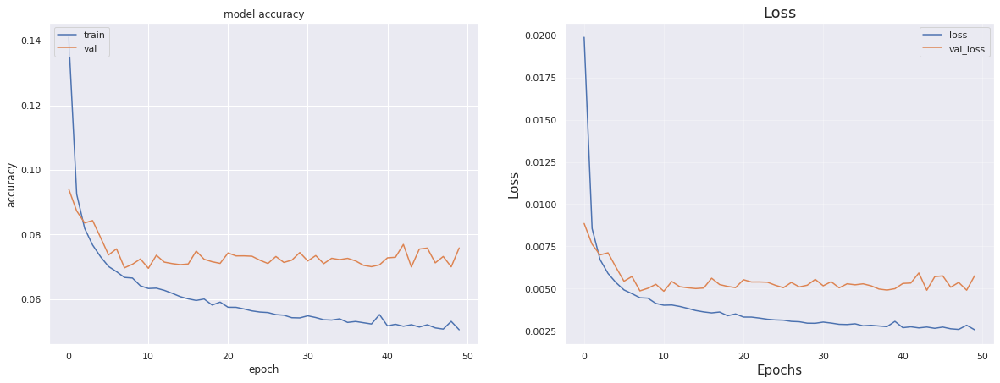

In [31]:
results1 = cross_validation(X_train, y_train, x_test, y_test)

In [32]:
# TEST DATA Fucntions

def prep_data(x, y_test , start , end , last, model, n_steps_out=24):
    #prepare test data X
    dataset_test_X = x[start:end, :]
    test_X_new = dataset_test_X.reshape(1,dataset_test_X.shape[0],dataset_test_X.shape[1])
    past_data = y_test[:end]
    dataset_test_y = y_test[end:last]
    scaler1 = MinMaxScaler(feature_range=(0, 1))
    scaler1.fit(dataset_test_y.values.reshape(-1, 1))
    y_pred = model.predict(test_X_new).reshape(-1, 1)
    y_pred_inv = scaler1.inverse_transform(y_pred)
    y_pred_inv = y_pred_inv.reshape(n_steps_out,1)
    y_pred_inv = y_pred_inv[:,0]
    
    return y_pred_inv , dataset_test_y , past_data


def evaluate_prediction(predictions, actual, model_name , start , end):
    errors = predictions - actual
    mse = np.square(errors).mean()
    rmse = np.sqrt(mse)
    mae = np.abs(errors).mean()
    r2 = 1-(sum(errors**2)/sum((actual-np.mean(actual))**2))
    print("Test Data from {} to {}".format(str(start), str(end)))
    print('Mean Square Error: {:.2f}'.format(mse))
    print('Mean Absolute Error: {:.2f}'.format(mae))
    print('Root Mean Square Error: {:.2f}'.format(rmse))
    print('R-Square: {:.2f}'.format(r2_score(actual,predictions)))
    print('')
    print('')
    d = {"MSE": mse, "RMSE": rmse, "MAE": mae, "R^2": r2}
    data = pd.DataFrame(d, index=[str(start)+" : "+str(end)])
    
    return(data)

In [33]:
# Plot history and future
def plot_multistep(history, prediction1 , groundtruth , start , end):
    plt.figure(figsize=(20, 4))
    
    y_mean = mean(prediction1)
    
    plt.plot(history.index, np.array(history), label='History')
    plt.plot(groundtruth.index, np.array(prediction1),label='Forecasted with LSTM')
    plt.plot(groundtruth.index, np.array(groundtruth),label='GroundTruth')
    
    plt.legend(loc='lower left')
    plt.title("Test Data from {} to {} , Mean = {:.2f}".format(history.index[0],
                               groundtruth.index[-1], y_mean) ,  fontsize=18)
    plt.xlabel('Time stamp' ,  fontsize=18)
    plt.ylabel('y-value' , fontsize=18)

In [34]:
# prepare test data
# Now shift values by * days

x_test = test_df[['kw','Temperature', 'Soil_Temperature', 'Sunshine_Duration',
                 'Precipitation_Total', 'waterlevel', 'watertemperature', 'kw_192']].copy()

y_test = test_df['kw']

scaler = MinMaxScaler(feature_range=(0, 1))

test_scaled = scaler.fit_transform(x_test.values)

Test Data from 2021-08-02 00:00:00 to 2021-08-02 23:00:00
Mean Square Error: 67.42
Mean Absolute Error: 6.75
Root Mean Square Error: 8.21
R-Square: -0.75


Test Data from 2021-08-03 00:00:00 to 2021-08-03 23:00:00
Mean Square Error: 115.42
Mean Absolute Error: 8.68
Root Mean Square Error: 10.74
R-Square: -1.01


Test Data from 2021-08-04 00:00:00 to 2021-08-04 23:00:00
Mean Square Error: 87.73
Mean Absolute Error: 6.93
Root Mean Square Error: 9.37
R-Square: -0.66


Test Data from 2021-08-05 00:00:00 to 2021-08-05 23:00:00
Mean Square Error: 93.72
Mean Absolute Error: 8.81
Root Mean Square Error: 9.68
R-Square: 0.69


Test Data from 2021-08-06 00:00:00 to 2021-08-06 23:00:00
Mean Square Error: 122.39
Mean Absolute Error: 9.79
Root Mean Square Error: 11.06
R-Square: 0.00


Test Data from 2021-08-07 00:00:00 to 2021-08-07 23:00:00
Mean Square Error: 29.04
Mean Absolute Error: 3.59
Root Mean Square Error: 5.39
R-Square: -0.25


Test Data from 2021-08-08 00:00:00 to 2021-08-08 23:00:00
Mean

/tmp/ipykernel_88/1491488613.py:3: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



Test Data from 2021-08-22 00:00:00 to 2021-08-22 23:00:00
Mean Square Error: 161.33
Mean Absolute Error: 10.56
Root Mean Square Error: 12.70
R-Square: -0.13


Test Data from 2021-08-23 00:00:00 to 2021-08-23 23:00:00
Mean Square Error: 31.48
Mean Absolute Error: 4.99
Root Mean Square Error: 5.61
R-Square: -0.53


Test Data from 2021-08-24 00:00:00 to 2021-08-24 23:00:00
Mean Square Error: 36.87
Mean Absolute Error: 4.39
Root Mean Square Error: 6.07
R-Square: -0.35


Test Data from 2021-08-25 00:00:00 to 2021-08-25 23:00:00
Mean Square Error: 114.71
Mean Absolute Error: 8.63
Root Mean Square Error: 10.71
R-Square: -1.59


Test Data from 2021-08-26 00:00:00 to 2021-08-26 23:00:00
Mean Square Error: 823.04
Mean Absolute Error: 27.24
Root Mean Square Error: 28.69
R-Square: -6.44


Test Data from 2021-08-27 00:00:00 to 2021-08-27 23:00:00
Mean Square Error: 55.61
Mean Absolute Error: 6.88
Root Mean Square Error: 7.46
R-Square: -1.36


Test Data from 2021-08-28 00:00:00 to 2021-08-28 23:00:0

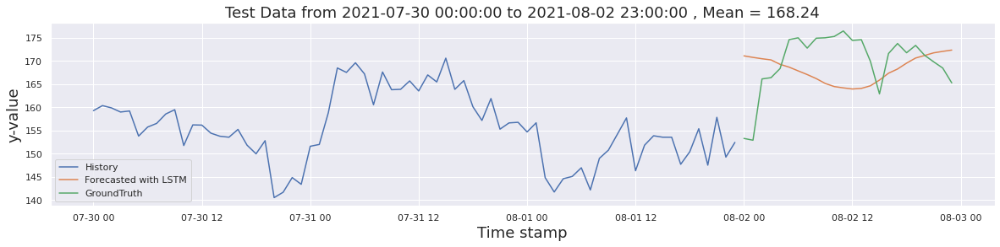

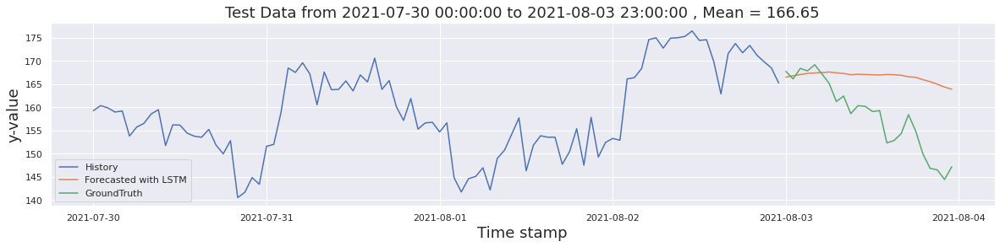

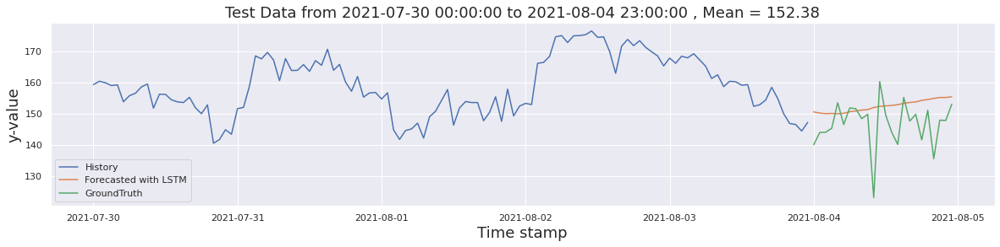

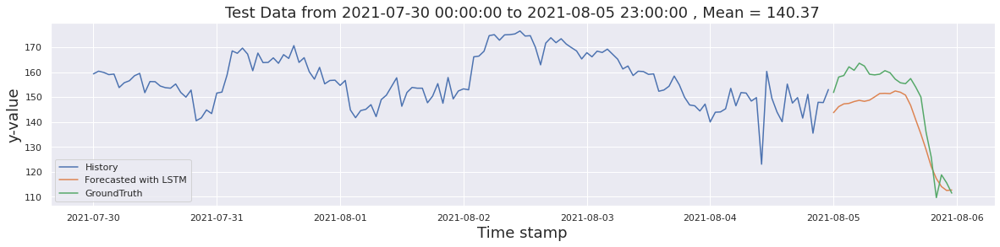

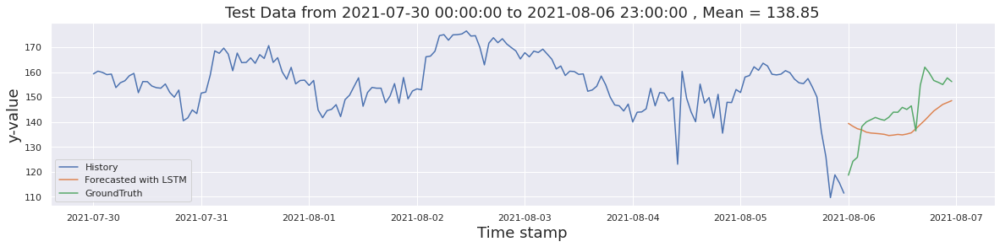

...

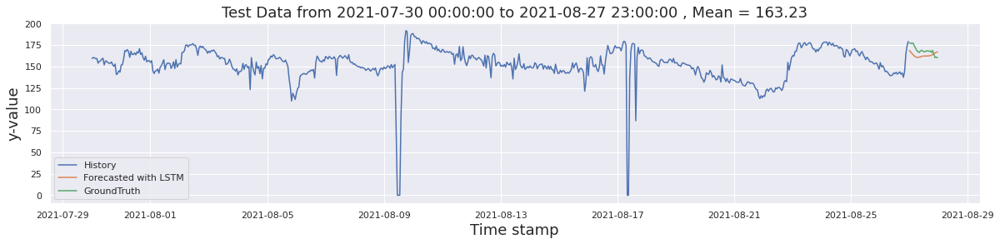

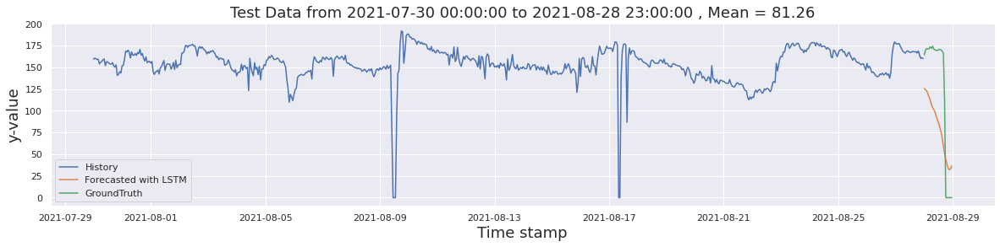

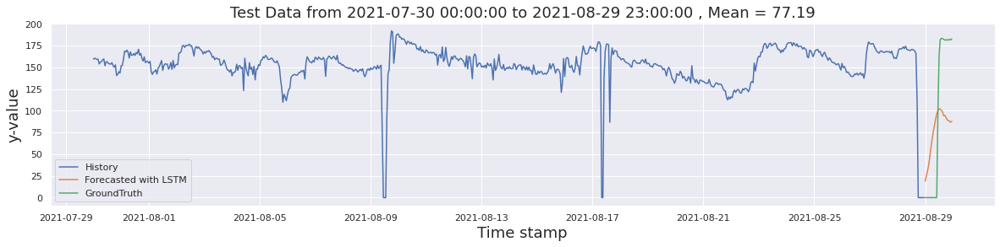

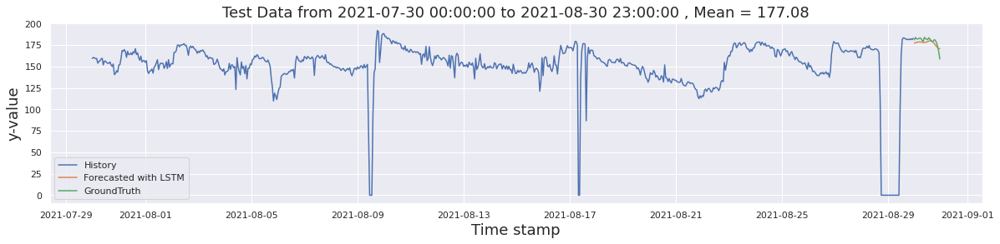

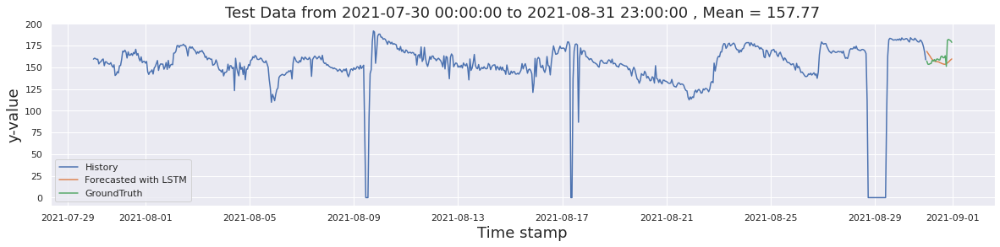

In [35]:
# all test batches

dfs1 = pd.DataFrame() # to save predictions
past = pd.DataFrame() # to save past data which is not used to evaluate metrics
error_metrics_1 = pd.DataFrame() # To save error metrics


for i in range(0,720,24):
    n_steps_in = 72
    n_steps_out = 24
    start = i
    end = start + n_steps_in 
    last = end + n_steps_out
    
    # prepare data for time series sequence
    y_pred_inv , dataset_test_y , past_data = prep_data(test_scaled, y_test, start,
                                                        end, last, results1)
    # plot the sequence
    plot_multistep(past_data , y_pred_inv , dataset_test_y , start , end)
    
    # calculate errors and then return dataframe
    errors = evaluate_prediction(y_pred_inv , dataset_test_y, 'LSTM' , dataset_test_y.index[0],
                                 dataset_test_y.index[-1])
    
    
    # concat with previour error data frames
    error_metrics_1 = pd.concat([error_metrics_1, errors], ignore_index=False)
    
    # save past data
    past = pd.DataFrame()
    past["past"] = past_data
    
    # concat with previour past data frames
    past = pd.concat([past], ignore_index=False)
    
    # create data to save multiple colums
    d = pd.DataFrame()
    d["Ground Truth"] = dataset_test_y
    d["Predictions"] = y_pred_inv
    
    # concat with outside dataframe to save all results
    dfs1 = pd.concat([dfs1, d], ignore_index=False)

# Now merge past and predictions dataframe on date column
all_data1 = past.merge(dfs1, right_index=True, left_index=True, how="outer")

In [36]:
all_data1.to_csv(os.path.join(forecast, "mm_lstm_h_2.csv"))

In [37]:
# close all plots
plt.close('all')

In [38]:
fig1 = px.line(all_data1, x=all_data1.index, y=["past", "Ground Truth", "Predictions"])
                                            
fig1.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=24, label='1 Day', step='hour', stepmode='backward'),
            dict(count=3*24, label='3 Day', step='hour', stepmode='backward'),
            dict(count=5*24, label='5 Day', step='hour', stepmode='backward'),
            dict(count=7*24, label='7 Day', step='hour', stepmode='backward'),
            dict(step='all')
            ])
    )
)

# Show plot 
fig1.show()

#fig1.write_html("model_hour_1.html")

In [39]:
error_metrics_1

,MSE,RMSE,MAE,R^2
2021-08-02 00:00:00 : 2021-08-02 23:00:00,67.418393,8.210870,6.748082,-0.748409
2021-08-03 00:00:00 : 2021-08-03 23:00:00,115.417488,10.743253,8.682462,-1.011397
2021-08-04 00:00:00 : 2021-08-04 23:00:00,87.733769,9.366631,6.931846,-0.660102
2021-08-05 00:00:00 : 2021-08-05 23:00:00,93.719773,9.680897,8.806142,0.694429
2021-08-06 00:00:00 : 2021-08-06 23:00:00,122.391220,11.063057,9.794645,0.004443
2021-08-07 00:00:00 : 2021-08-07 23:00:00,29.043394,5.389192,3.587621,-0.246566
2021-08-08 00:00:00 : 2021-08-08 23:00:00,13.393870,3.659764,2.850504,-0.549593
2021-08-09 00:00:00 : 2021-08-09 23:00:00,3864.753065,62.167138,35.406117,-0.191945
2021-08-10 00:00:00 : 2021-08-10 23:00:00,133.369644,11.548578,9.898700,-2.981104
2021-08-11 00:00:00 : 2021-08-11 23:00:00,92.531249,9.619316,8.165809,-1.626767


## Model 2: Using past 3 days Kw values to predict future day kw values

In [40]:
x1 = df["kw"].values.reshape(-1, 1)
y = df["kw"].values

n_steps_in, past,  n_steps_out = 24, 3, 24
X, Y = prepare_time_series(x1, y, input_steps=n_steps_in, output_steps=n_steps_out, past=past)

X_train, y_train, x_test, y_test = train_test_split(X, Y)

X.shape (68522, 72, 1)
y.shape (68522, 24)
train_X.shape (61669, 72, 1)
train_y.shape (61669, 24)
test_X.shape (6853, 72, 1)
test_y.shape (6853, 24)
n_features 1


Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_14 (LSTM)               (None, 72, 50)            10400     
_________________________________________________________________
dropout_14 (Dropout)         (None, 72, 50)            0         
_________________________________________________________________
lstm_15 (LSTM)               (None, 50)                20200     
_________________________________________________________________
dropout_15 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 24)                1224      
Total params: 31,824
Trainable params: 31,824
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
571/571 [==============================] - 6s 8ms/step - loss: 0.0131 - root_mean_squared_error: 0.1143 -

571/571 [==============================] - 4s 7ms/step - loss: 0.0069 - root_mean_squared_error: 0.0829 - val_loss: 0.0099 - val_root_mean_squared_error: 0.0993
Epoch 43/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0079 - root_mean_squared_error: 0.0889 - val_loss: 0.0124 - val_root_mean_squared_error: 0.1113
Epoch 44/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0108 - root_mean_squared_error: 0.1038 - val_loss: 0.0107 - val_root_mean_squared_error: 0.1033
Epoch 45/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0093 - root_mean_squared_error: 0.0964 - val_loss: 0.0101 - val_root_mean_squared_error: 0.1004
Epoch 46/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0090 - root_mean_squared_error: 0.0950 - val_loss: 0.0098 - val_root_mean_squared_error: 0.0987
Epoch 47/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0089 - root_mean_squared_error: 0.0946 - val_loss: 0.0102 - val_root_m

572/572 [==============================] - 5s 8ms/step - loss: 0.0078 - root_mean_squared_error: 0.0882 - val_loss: 0.0089 - val_root_mean_squared_error: 0.0944
Epoch 34/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0077 - root_mean_squared_error: 0.0876 - val_loss: 0.0086 - val_root_mean_squared_error: 0.0926
Epoch 35/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0092 - root_mean_squared_error: 0.0959 - val_loss: 0.0094 - val_root_mean_squared_error: 0.0971
Epoch 36/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0089 - root_mean_squared_error: 0.0942 - val_loss: 0.0093 - val_root_mean_squared_error: 0.0964
Epoch 37/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0086 - root_mean_squared_error: 0.0929 - val_loss: 0.0093 - val_root_mean_squared_error: 0.0966
Epoch 38/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0084 - root_mean_squared_error: 0.0916 - val_loss: 0.0094 - val_root_m

572/572 [==============================] - 4s 8ms/step - loss: 0.0076 - root_mean_squared_error: 0.0874 - val_loss: 0.0095 - val_root_mean_squared_error: 0.0977
Epoch 25/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0074 - root_mean_squared_error: 0.0863 - val_loss: 0.0093 - val_root_mean_squared_error: 0.0964
Epoch 26/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0073 - root_mean_squared_error: 0.0857 - val_loss: 0.0094 - val_root_mean_squared_error: 0.0968
Epoch 27/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0074 - root_mean_squared_error: 0.0860 - val_loss: 0.0095 - val_root_mean_squared_error: 0.0974
Epoch 28/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0074 - root_mean_squared_error: 0.0858 - val_loss: 0.0098 - val_root_mean_squared_error: 0.0992
Epoch 29/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0072 - root_mean_squared_error: 0.0850 - val_loss: 0.0097 - val_root_m

571/571 [==============================] - 4s 7ms/step - loss: 0.0079 - root_mean_squared_error: 0.0886 - val_loss: 0.0097 - val_root_mean_squared_error: 0.0985
Epoch 16/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0080 - root_mean_squared_error: 0.0892 - val_loss: 0.0095 - val_root_mean_squared_error: 0.0976
Epoch 17/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0078 - root_mean_squared_error: 0.0882 - val_loss: 0.0098 - val_root_mean_squared_error: 0.0992
Epoch 18/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0077 - root_mean_squared_error: 0.0878 - val_loss: 0.0099 - val_root_mean_squared_error: 0.0996
Epoch 19/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0077 - root_mean_squared_error: 0.0875 - val_loss: 0.0097 - val_root_mean_squared_error: 0.0986
Epoch 20/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0076 - root_mean_squared_error: 0.0874 - val_loss: 0.0097 - val_root_m

572/572 [==============================] - 5s 8ms/step - loss: 0.0097 - root_mean_squared_error: 0.0987 - val_loss: 0.0101 - val_root_mean_squared_error: 0.1006
Epoch 7/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0096 - root_mean_squared_error: 0.0980 - val_loss: 0.0101 - val_root_mean_squared_error: 0.1006
Epoch 8/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0093 - root_mean_squared_error: 0.0965 - val_loss: 0.0097 - val_root_mean_squared_error: 0.0986
Epoch 9/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0091 - root_mean_squared_error: 0.0953 - val_loss: 0.0100 - val_root_mean_squared_error: 0.1001
Epoch 10/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0089 - root_mean_squared_error: 0.0945 - val_loss: 0.0093 - val_root_mean_squared_error: 0.0967
Epoch 11/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0089 - root_mean_squared_error: 0.0942 - val_loss: 0.0092 - val_root_mean

572/572 [==============================] - 7s 9ms/step - loss: 0.0271 - root_mean_squared_error: 0.1646 - val_loss: 0.0139 - val_root_mean_squared_error: 0.1177
Epoch 2/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0124 - root_mean_squared_error: 0.1115 - val_loss: 0.0109 - val_root_mean_squared_error: 0.1046
Epoch 3/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0107 - root_mean_squared_error: 0.1035 - val_loss: 0.0115 - val_root_mean_squared_error: 0.1071
Epoch 4/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0099 - root_mean_squared_error: 0.0994 - val_loss: 0.0106 - val_root_mean_squared_error: 0.1028
Epoch 5/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0094 - root_mean_squared_error: 0.0970 - val_loss: 0.0104 - val_root_mean_squared_error: 0.1022
Epoch 6/50
572/572 [==============================] - 4s 7ms/step - loss: 0.0090 - root_mean_squared_error: 0.0949 - val_loss: 0.0104 - val_root_mean_s

572/572 [==============================] - 5s 8ms/step - loss: 0.0073 - root_mean_squared_error: 0.0852 - val_loss: 0.0091 - val_root_mean_squared_error: 0.0952
Epoch 49/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0073 - root_mean_squared_error: 0.0855 - val_loss: 0.0089 - val_root_mean_squared_error: 0.0946
Epoch 50/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0072 - root_mean_squared_error: 0.0848 - val_loss: 0.0095 - val_root_mean_squared_error: 0.0976
Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_26 (LSTM)               (None, 72, 50)            10400     
_________________________________________________________________
dropout_26 (Dropout)         (None, 72, 50)            0         
_________________________________________________________________
lstm_27 (LSTM)               (None, 50)                20200     
________

857/857 [==============================] - 7s 8ms/step - loss: 0.0072 - root_mean_squared_error: 0.0849 - val_loss: 0.0093 - val_root_mean_squared_error: 0.0965
Epoch 40/50
857/857 [==============================] - 7s 8ms/step - loss: 0.0072 - root_mean_squared_error: 0.0846 - val_loss: 0.0093 - val_root_mean_squared_error: 0.0964
Epoch 41/50
857/857 [==============================] - 6s 7ms/step - loss: 0.0072 - root_mean_squared_error: 0.0848 - val_loss: 0.0093 - val_root_mean_squared_error: 0.0966
Epoch 42/50
857/857 [==============================] - 6s 7ms/step - loss: 0.0071 - root_mean_squared_error: 0.0845 - val_loss: 0.0091 - val_root_mean_squared_error: 0.0951
Epoch 43/50
857/857 [==============================] - 7s 8ms/step - loss: 0.0071 - root_mean_squared_error: 0.0845 - val_loss: 0.0090 - val_root_mean_squared_error: 0.0949
Epoch 44/50
857/857 [==============================] - 6s 7ms/step - loss: 0.0071 - root_mean_squared_error: 0.0840 - val_loss: 0.0093 - val_root_m

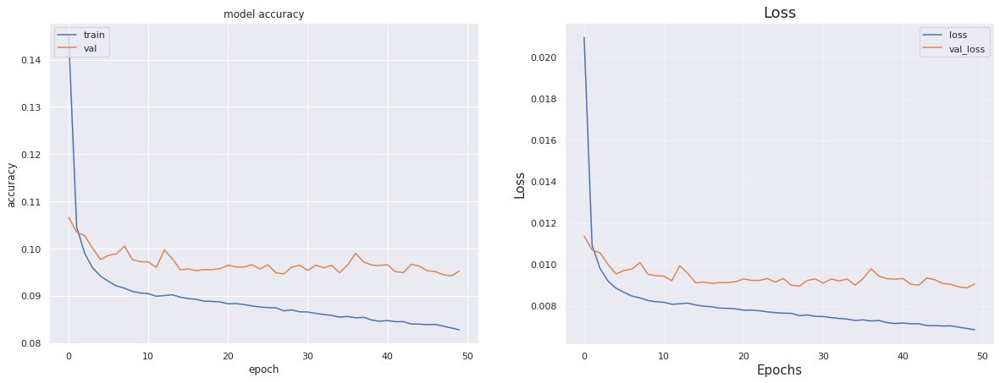

In [41]:
results2 = cross_validation(X_train, y_train, x_test, y_test)

In [42]:
x_test = test_df["kw"].values.reshape(-1, 1)
y_test = test_df['kw']



scaler = MinMaxScaler(feature_range=(0, 1))

test_scaled = scaler.fit_transform(x_test)

Test Data from 2021-08-02 00:00:00 to 2021-08-02 23:00:00
Mean Square Error: 41.62
Mean Absolute Error: 4.37
Root Mean Square Error: 6.45
R-Square: -0.08


Test Data from 2021-08-03 00:00:00 to 2021-08-03 23:00:00
Mean Square Error: 116.27
Mean Absolute Error: 8.53
Root Mean Square Error: 10.78
R-Square: -1.03


Test Data from 2021-08-04 00:00:00 to 2021-08-04 23:00:00
Mean Square Error: 74.41
Mean Absolute Error: 6.04
Root Mean Square Error: 8.63
R-Square: -0.41


Test Data from 2021-08-05 00:00:00 to 2021-08-05 23:00:00
Mean Square Error: 309.36
Mean Absolute Error: 12.32
Root Mean Square Error: 17.59
R-Square: -0.01


Test Data from 2021-08-06 00:00:00 to 2021-08-06 23:00:00
Mean Square Error: 255.35
Mean Absolute Error: 13.57
Root Mean Square Error: 15.98
R-Square: -1.08


Test Data from 2021-08-07 00:00:00 to 2021-08-07 23:00:00
Mean Square Error: 23.83
Mean Absolute Error: 2.94
Root Mean Square Error: 4.88
R-Square: -0.02


Test Data from 2021-08-08 00:00:00 to 2021-08-08 23:00:0

/tmp/ipykernel_88/1491488613.py:3: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



Test Data from 2021-08-22 00:00:00 to 2021-08-22 23:00:00
Mean Square Error: 278.13
Mean Absolute Error: 15.85
Root Mean Square Error: 16.68
R-Square: -0.95


Test Data from 2021-08-23 00:00:00 to 2021-08-23 23:00:00
Mean Square Error: 28.46
Mean Absolute Error: 4.13
Root Mean Square Error: 5.33
R-Square: -0.38


Test Data from 2021-08-24 00:00:00 to 2021-08-24 23:00:00
Mean Square Error: 39.49
Mean Absolute Error: 4.53
Root Mean Square Error: 6.28
R-Square: -0.45


Test Data from 2021-08-25 00:00:00 to 2021-08-25 23:00:00
Mean Square Error: 78.12
Mean Absolute Error: 7.03
Root Mean Square Error: 8.84
R-Square: -0.76


Test Data from 2021-08-26 00:00:00 to 2021-08-26 23:00:00
Mean Square Error: 633.65
Mean Absolute Error: 23.96
Root Mean Square Error: 25.17
R-Square: -4.73


Test Data from 2021-08-27 00:00:00 to 2021-08-27 23:00:00
Mean Square Error: 63.45
Mean Absolute Error: 6.97
Root Mean Square Error: 7.97
R-Square: -1.69


Test Data from 2021-08-28 00:00:00 to 2021-08-28 23:00:00


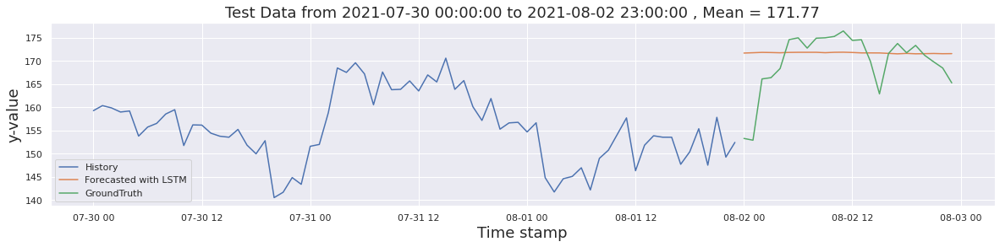

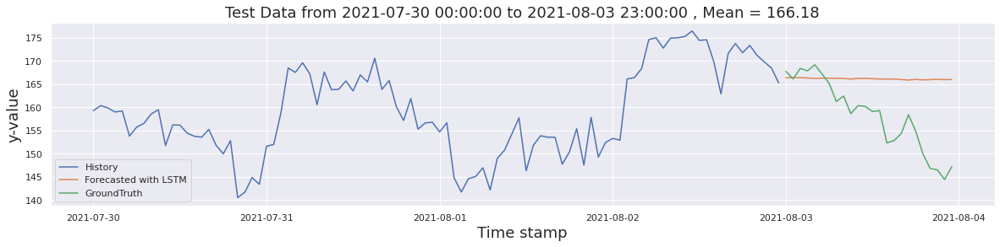

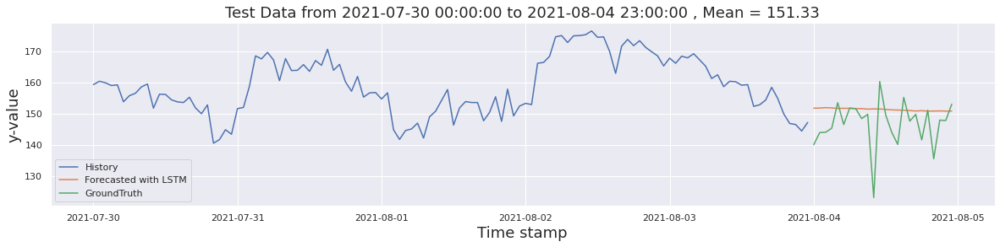

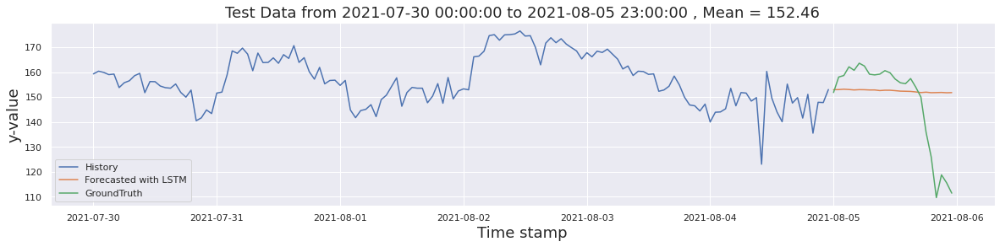

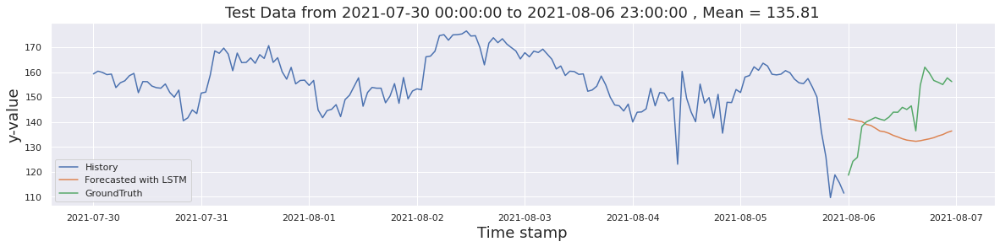

...

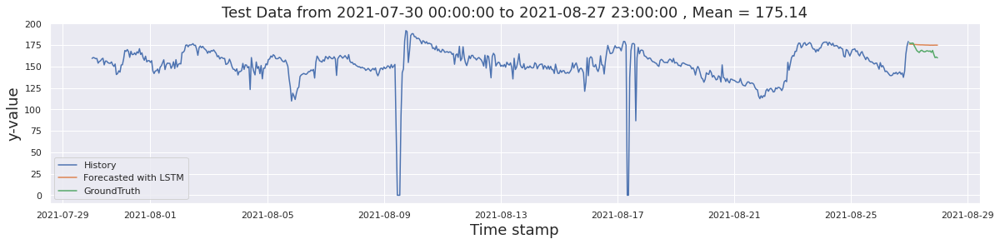

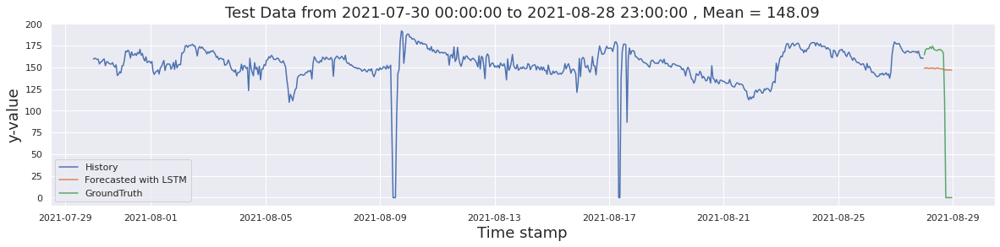

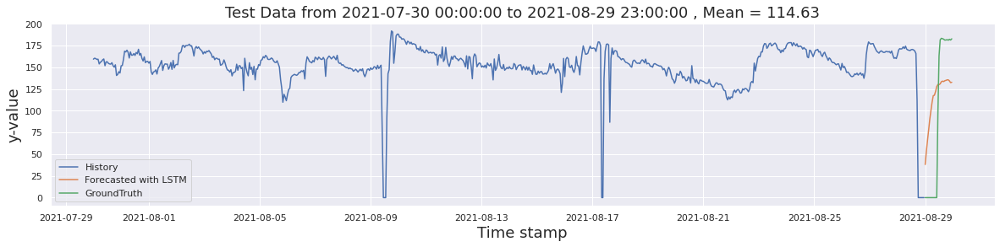

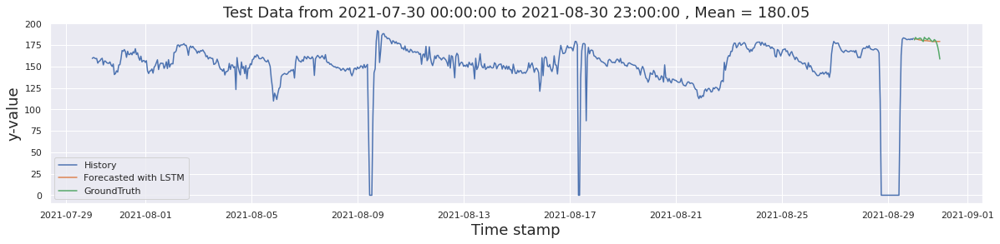

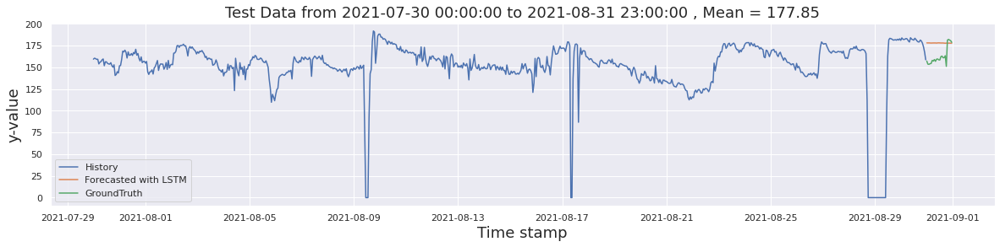

In [43]:
# all test batches

dfs2 = pd.DataFrame() # to save predictions
past = pd.DataFrame() # to save past data which is not used to evaluate metrics
error_metrics_2 = pd.DataFrame() # To save error metrics


for i in range(0,720,24):
    n_steps_in = 72
    n_steps_out = 24
    start = i
    end = start + n_steps_in 
    last = end + n_steps_out
    
    # prepare data for time series sequence
    y_pred_inv , dataset_test_y , past_data = prep_data(test_scaled, y_test, start,
                                                        end, last, results2)
    # plot the sequence
    plot_multistep(past_data , y_pred_inv , dataset_test_y , start , end)
    
    # calculate errors and then return dataframe
    errors = evaluate_prediction(y_pred_inv , dataset_test_y, 'LSTM' , dataset_test_y.index[0],
                                 dataset_test_y.index[-1])
    
    
    # concat with previour error data frames
    error_metrics_2 = pd.concat([error_metrics_2, errors], ignore_index=False)
    
    # save past data
    past = pd.DataFrame()
    past["past"] = past_data
    
    # concat with previour past data frames
    past = pd.concat([past], ignore_index=False)
    
    # create data to save multiple colums
    d = pd.DataFrame()
    d["Ground Truth"] = dataset_test_y
    d["Predictions"] = y_pred_inv
    
    # concat with outside dataframe to save all results
    dfs2 = pd.concat([dfs2, d], ignore_index=False)

# Now merge past and predictions dataframe on date column
all_data2 = past.merge(dfs2, right_index=True, left_index=True, how="outer")

In [44]:
all_data2.to_csv(os.path.join(forecast, "mm_lstm_h_1.csv"))

In [45]:
fig2 = px.line(all_data2, x=all_data2.index, y=["past", "Ground Truth", "Predictions"])
                                            
fig2.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=24, label='1 Day', step='hour', stepmode='backward'),
            dict(count=3*24, label='3 Day', step='hour', stepmode='backward'),
            dict(count=5*24, label='5 Day', step='hour', stepmode='backward'),
            dict(count=7*24, label='7 Day', step='hour', stepmode='backward'),
            dict(step='all')
            ])
    )
)

# Show plot 
fig2.show()

In [46]:
# close all plots
plt.close('all')

In [47]:
error_metrics_2

,MSE,RMSE,MAE,R^2
2021-08-02 00:00:00 : 2021-08-02 23:00:00,41.624190,6.451681,4.370253,-0.079469
2021-08-03 00:00:00 : 2021-08-03 23:00:00,116.269848,10.782850,8.530982,-1.026251
2021-08-04 00:00:00 : 2021-08-04 23:00:00,74.407369,8.625971,6.044095,-0.407939
2021-08-05 00:00:00 : 2021-08-05 23:00:00,309.355548,17.588506,12.323796,-0.008647
2021-08-06 00:00:00 : 2021-08-06 23:00:00,255.354991,15.979831,13.565220,-1.077113
2021-08-07 00:00:00 : 2021-08-07 23:00:00,23.829939,4.881592,2.939915,-0.022800
2021-08-08 00:00:00 : 2021-08-08 23:00:00,19.533937,4.419721,3.594661,-1.259963
2021-08-09 00:00:00 : 2021-08-09 23:00:00,3468.768561,58.896253,34.861463,-0.069818
2021-08-10 00:00:00 : 2021-08-10 23:00:00,120.463821,10.975601,9.532713,-2.595863
2021-08-11 00:00:00 : 2021-08-11 23:00:00,94.243608,9.707915,8.143435,-1.675377


## Model 3: All Features with shifting features values to 25 hours in future

In [48]:
x1 = df.values
y = df["kw"].values

n_steps_in, past,  n_steps_out = 24, 3, 24

X, Y = prepare_time_series(x1, y, input_steps=n_steps_in,
                                    output_steps=n_steps_out, past=past,
                                   PCA=True)

X_train, y_train, x_test, y_test = train_test_split(X, Y)

dataset_stacked.shape (68616, 6)
X.shape (68522, 72, 5)
y.shape (68522, 24)
train_X.shape (61669, 72, 5)
train_y.shape (61669, 24)
test_X.shape (6853, 72, 5)
test_y.shape (6853, 24)
n_features 5


In [ ]:
results3 = cross_validation(X_train, y_train, x_test, y_test)

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_28 (LSTM)               (None, 72, 50)            11200     
_________________________________________________________________
dropout_28 (Dropout)         (None, 72, 50)            0         
_________________________________________________________________
lstm_29 (LSTM)               (None, 50)                20200     
_________________________________________________________________
dropout_29 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_14 (Dense)             (None, 24)                1224      
Total params: 32,624
Trainable params: 32,624
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
571/571 [==============================] - 6s 8ms/step - loss: 0.0277 - root_mean_squared_error: 0.1665 

571/571 [==============================] - 4s 7ms/step - loss: 0.0034 - root_mean_squared_error: 0.0580 - val_loss: 0.0313 - val_root_mean_squared_error: 0.1770
Epoch 43/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0028 - root_mean_squared_error: 0.0526 - val_loss: 0.0312 - val_root_mean_squared_error: 0.1767
Epoch 44/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0027 - root_mean_squared_error: 0.0517 - val_loss: 0.0301 - val_root_mean_squared_error: 0.1734
Epoch 45/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0027 - root_mean_squared_error: 0.0524 - val_loss: 0.0332 - val_root_mean_squared_error: 0.1822
Epoch 46/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0027 - root_mean_squared_error: 0.0521 - val_loss: 0.0337 - val_root_mean_squared_error: 0.1835
Epoch 47/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0027 - root_mean_squared_error: 0.0522 - val_loss: 0.0303 - val_root_m

572/572 [==============================] - 5s 8ms/step - loss: 0.0034 - root_mean_squared_error: 0.0587 - val_loss: 0.0241 - val_root_mean_squared_error: 0.1552
Epoch 34/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0030 - root_mean_squared_error: 0.0549 - val_loss: 0.0241 - val_root_mean_squared_error: 0.1551
Epoch 35/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0030 - root_mean_squared_error: 0.0551 - val_loss: 0.0242 - val_root_mean_squared_error: 0.1556
Epoch 36/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0031 - root_mean_squared_error: 0.0553 - val_loss: 0.0233 - val_root_mean_squared_error: 0.1527
Epoch 37/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0030 - root_mean_squared_error: 0.0551 - val_loss: 0.0236 - val_root_mean_squared_error: 0.1535
Epoch 38/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0033 - root_mean_squared_error: 0.0578 - val_loss: 0.0249 - val_root_m

572/572 [==============================] - 4s 8ms/step - loss: 0.0031 - root_mean_squared_error: 0.0560 - val_loss: 0.0263 - val_root_mean_squared_error: 0.1623
Epoch 25/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0034 - root_mean_squared_error: 0.0581 - val_loss: 0.0280 - val_root_mean_squared_error: 0.1674
Epoch 26/50
572/572 [==============================] - 5s 9ms/step - loss: 0.0031 - root_mean_squared_error: 0.0553 - val_loss: 0.0272 - val_root_mean_squared_error: 0.1649
Epoch 27/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0029 - root_mean_squared_error: 0.0534 - val_loss: 0.0287 - val_root_mean_squared_error: 0.1693
Epoch 28/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0029 - root_mean_squared_error: 0.0535 - val_loss: 0.0273 - val_root_mean_squared_error: 0.1654
Epoch 29/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0031 - root_mean_squared_error: 0.0558 - val_loss: 0.0244 - val_root_m

571/571 [==============================] - 4s 7ms/step - loss: 0.0072 - root_mean_squared_error: 0.0848 - val_loss: 0.0282 - val_root_mean_squared_error: 0.1680
Epoch 16/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0066 - root_mean_squared_error: 0.0815 - val_loss: 0.0274 - val_root_mean_squared_error: 0.1656
Epoch 17/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0062 - root_mean_squared_error: 0.0790 - val_loss: 0.0263 - val_root_mean_squared_error: 0.1623
Epoch 18/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0059 - root_mean_squared_error: 0.0767 - val_loss: 0.0300 - val_root_mean_squared_error: 0.1731
Epoch 19/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0056 - root_mean_squared_error: 0.0750 - val_loss: 0.0312 - val_root_mean_squared_error: 0.1767
Epoch 20/50
571/571 [==============================] - 4s 7ms/step - loss: 0.0054 - root_mean_squared_error: 0.0733 - val_loss: 0.0316 - val_root_m

572/572 [==============================] - 4s 8ms/step - loss: 0.0157 - root_mean_squared_error: 0.1254 - val_loss: 0.0261 - val_root_mean_squared_error: 0.1615
Epoch 7/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0143 - root_mean_squared_error: 0.1196 - val_loss: 0.0308 - val_root_mean_squared_error: 0.1756
Epoch 8/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0131 - root_mean_squared_error: 0.1146 - val_loss: 0.0235 - val_root_mean_squared_error: 0.1532
Epoch 9/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0118 - root_mean_squared_error: 0.1084 - val_loss: 0.0220 - val_root_mean_squared_error: 0.1485
Epoch 10/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0106 - root_mean_squared_error: 0.1030 - val_loss: 0.0224 - val_root_mean_squared_error: 0.1498
Epoch 11/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0097 - root_mean_squared_error: 0.0985 - val_loss: 0.0254 - val_root_mean

572/572 [==============================] - 7s 9ms/step - loss: 0.0448 - root_mean_squared_error: 0.2116 - val_loss: 0.0356 - val_root_mean_squared_error: 0.1886
Epoch 2/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0267 - root_mean_squared_error: 0.1634 - val_loss: 0.0219 - val_root_mean_squared_error: 0.1481
Epoch 3/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0232 - root_mean_squared_error: 0.1523 - val_loss: 0.0223 - val_root_mean_squared_error: 0.1493
Epoch 4/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0202 - root_mean_squared_error: 0.1420 - val_loss: 0.0220 - val_root_mean_squared_error: 0.1483
Epoch 5/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0173 - root_mean_squared_error: 0.1316 - val_loss: 0.0277 - val_root_mean_squared_error: 0.1664
Epoch 6/50
572/572 [==============================] - 5s 8ms/step - loss: 0.0154 - root_mean_squared_error: 0.1241 - val_loss: 0.0251 - val_root_mean_s

572/572 [==============================] - 4s 8ms/step - loss: 0.0029 - root_mean_squared_error: 0.0537 - val_loss: 0.0291 - val_root_mean_squared_error: 0.1706
Epoch 49/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0029 - root_mean_squared_error: 0.0540 - val_loss: 0.0306 - val_root_mean_squared_error: 0.1750
Epoch 50/50
572/572 [==============================] - 4s 8ms/step - loss: 0.0029 - root_mean_squared_error: 0.0542 - val_loss: 0.0323 - val_root_mean_squared_error: 0.1798
Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_40 (LSTM)               (None, 72, 50)            11200     
_________________________________________________________________
dropout_40 (Dropout)         (None, 72, 50)            0         
_________________________________________________________________
lstm_41 (LSTM)               (None, 50)                20200     
________

857/857 [==============================] - 7s 8ms/step - loss: 0.0307 - root_mean_squared_error: 0.1751 - val_loss: 0.0290 - val_root_mean_squared_error: 0.1702
Epoch 40/50
857/857 [==============================] - 7s 8ms/step - loss: 0.0305 - root_mean_squared_error: 0.1746 - val_loss: 0.0288 - val_root_mean_squared_error: 0.1698
Epoch 41/50
857/857 [==============================] - 7s 8ms/step - loss: 0.0303 - root_mean_squared_error: 0.1742 - val_loss: 0.0271 - val_root_mean_squared_error: 0.1645
Epoch 42/50
857/857 [==============================] - 7s 8ms/step - loss: 0.0307 - root_mean_squared_error: 0.1752 - val_loss: 0.0305 - val_root_mean_squared_error: 0.1745
Epoch 43/50
857/857 [==============================] - 7s 8ms/step - loss: 0.0302 - root_mean_squared_error: 0.1738 - val_loss: 0.0292 - val_root_mean_squared_error: 0.1709
Epoch 44/50
857/857 [==============================] - 6s 7ms/step - loss: 0.0297 - root_mean_squared_error: 0.1723 - val_loss: 0.0296 - val_root_m

In [ ]:
# prepare test data

x_test = test_df
y_test = test_df['kw']


scaler = MinMaxScaler(feature_range=(0, 1))

test_ = scaler.fit_transform(x_test.values)
pca = decomposition.PCA(n_components=5)
test_scaled = pca.fit_transform(test_)

In [ ]:
# all test batches

dfs3 = pd.DataFrame() # to save predictions
past = pd.DataFrame() # to save past data which is not used to evaluate metrics
error_metrics_3 = pd.DataFrame() # To save error metrics


for i in range(0,720,24):
    n_steps_in = 72
    n_steps_out = 24
    start = i
    end = start + n_steps_in 
    last = end + n_steps_out
    
    # prepare data for time series sequence
    y_pred_inv , dataset_test_y , past_data = prep_data(test_scaled, y_test, start,
                                                        end, last, results3)
    # plot the sequence
    plot_multistep(past_data , y_pred_inv , dataset_test_y , start , end)
    
    # calculate errors and then return dataframe
    errors = evaluate_prediction(y_pred_inv , dataset_test_y, 'LSTM' , dataset_test_y.index[0],
                                 dataset_test_y.index[-1])
    
    
    # concat with previour error data frames
    error_metrics_3 = pd.concat([error_metrics_3, errors], ignore_index=False)
    
    # save past data
    past = pd.DataFrame()
    past["past"] = past_data
    
    # concat with previour past data frames
    past = pd.concat([past], ignore_index=False)
    
    # create data to save multiple colums
    d = pd.DataFrame()
    d["Ground Truth"] = dataset_test_y
    d["Predictions"] = y_pred_inv
    
    # concat with outside dataframe to save all results
    dfs3 = pd.concat([dfs3, d], ignore_index=False)

# Now merge past and predictions dataframe on date column
all_data3 = past.merge(dfs3, right_index=True, left_index=True, how="outer") 

In [ ]:
all_data3.to_csv(os.path.join(forecast, "mm_lstm_h_3.csv"))

In [ ]:
fig3 = px.line(all_data3, x=all_data2.index, y=["past", "Ground Truth", "Predictions"])
                                            
fig3.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=24, label='1 Day', step='hour', stepmode='backward'),
            dict(count=3*24, label='3 Day', step='hour', stepmode='backward'),
            dict(count=5*24, label='5 Day', step='hour', stepmode='backward'),
            dict(count=7*24, label='7 Day', step='hour', stepmode='backward'),
            dict(step='all')
            ])
    )
)

# Show plot 
fig2.show()

In [ ]:
error_metrics_3

In [ ]:
from ipylab import JupyterFrontEnd

app = JupyterFrontEnd()
app.commands.execute('docmanager:save')